# 01 — ROI-to-anatomy geometry review

Review where each functional ROI falls on the anatomy image. Genes and response measures are not used in this review.

In [1]:
# 02 — Choose the fish and load the review tools
from pathlib import Path
from codeants_2pf_hcr.qc_notebooks import QCNotebookConfig, resolve_qc_notebook_context, write_qc_review_record
from codeants_2pf_hcr.spatial import load_or_cache_voxels
from codeants_2pf_hcr.plots.qc_geometry import audit_xy_offset_units, load_geometry_review_bundle, render_centroid_offset_detail, render_geometry_placement_overview, render_xy_offset_unit_audit, show_geometry_review_dashboard, summarize_geometry_review

FISH_ID = 'L765_f04'
LOCAL_ROOT = Path('/Volumes/dataDrive/dataProcessing/2p_processing')
PIPELINE_ROOT = Path('/Volumes/dataDrive/dataProcessing/2p_processing/_staged_pipeline_runs/20260803T112035Z_functional_registration_ants_no_fallback/L765_f04')


In [2]:
# 03 — Load the geometry results
qc_context = resolve_qc_notebook_context(QCNotebookConfig(
    fish_id=FISH_ID,
    local_root=LOCAL_ROOT,
    pipeline_root=PIPELINE_ROOT,
))
geometry_root = qc_context.stage_paths['match-roi-to-anatomy'] / 'registration'
geometry = load_geometry_review_bundle(
    geometry_root,
    expected_fish_id=FISH_ID,
    anatomy_stack_path=qc_context.fish_dir / '02_reg' / '00_preprocessing' / '2p_anatomy' / f'{FISH_ID}_anatomy_2P_GCaMP.nrrd',
    anatomy_labels_path=qc_context.fish_dir / '03_analysis' / 'structural' / 'cp_masks' / f'{FISH_ID}_anatomy_00001_uint8_8bit_cp_masks.tif',
    plane_refs_path=geometry_root / 'plane_refs_summary_geometry.json',
    transformed_roi_root=qc_context.stage_paths['transform-functional-rois-to-anatomy'],
)
display(summarize_geometry_review(geometry.matches))

,plane_idx,plane,n_rois,n_unique_matches,n_no_overlap,n_competition_lost,n_other_unmatched,unique_match_fraction,median_selected_dist_um,median_selected_overlap_px
0,0,L765_f04_plane0_mcorrected_flipX,309,303,5,1,0,0.980583,2.443817,86.0
1,1,L765_f04_plane1_mcorrected_flipX,412,401,7,4,0,0.973301,2.439109,76.0
2,2,L765_f04_plane2_mcorrected_flipX,437,427,5,5,0,0.977117,2.544335,75.0
3,3,L765_f04_plane3_mcorrected_flipX,510,480,25,5,0,0.941176,2.904056,64.0
4,4,L765_f04_plane4_mcorrected_flipX,409,391,14,4,0,0.955990,2.998358,73.0
5,5,L765_f04_plane5_mcorrected_flipX,258,242,14,2,0,0.937984,2.844120,79.0
6,6,L765_f04_plane6_mcorrected_flipX,326,318,6,2,0,0.975460,2.481290,83.0
7,7,L765_f04_plane7_mcorrected_flipX,385,376,8,1,0,0.976623,2.955036,77.0
8,8,L765_f04_plane8_mcorrected_flipX,303,289,11,3,0,0.953795,3.174543,69.0
9,9,L765_f04_plane9_mcorrected_flipX,204,192,9,3,0,0.941176,3.788793,71.0


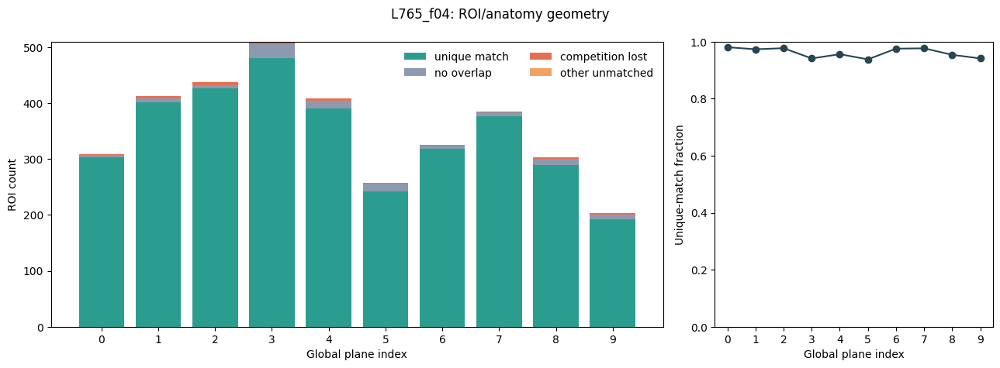

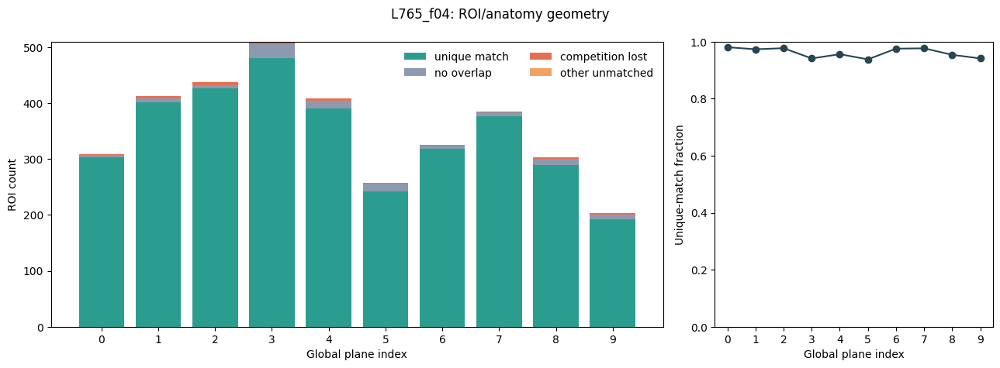

In [ ]:
# 04 — Display the geometry summary
geometry_dashboard = show_geometry_review_dashboard(geometry, max_rows=50)
display(geometry_dashboard['figure'])

## 05 — Review in-plane label placement

Each panel uses the best anatomy Z for one functional plane. Cyan outlines are anatomy labels and magenta outlines are transformed functional ROIs. Matching outlines on the same anatomy features support accurate in-plane placement.

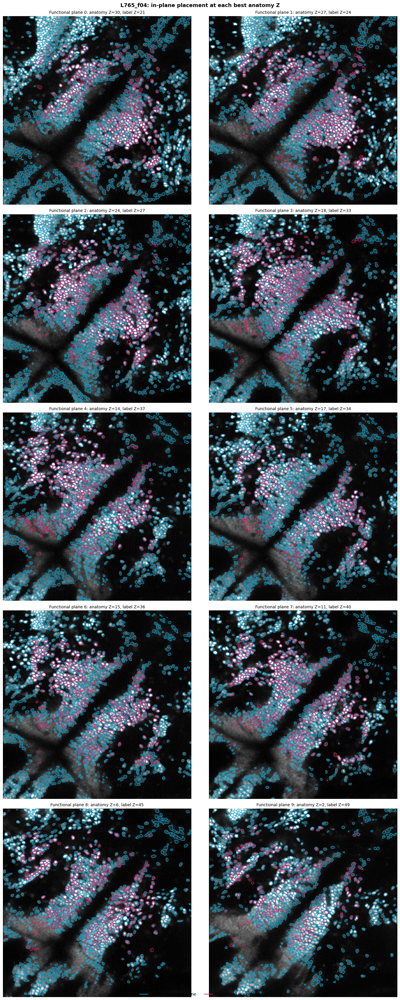

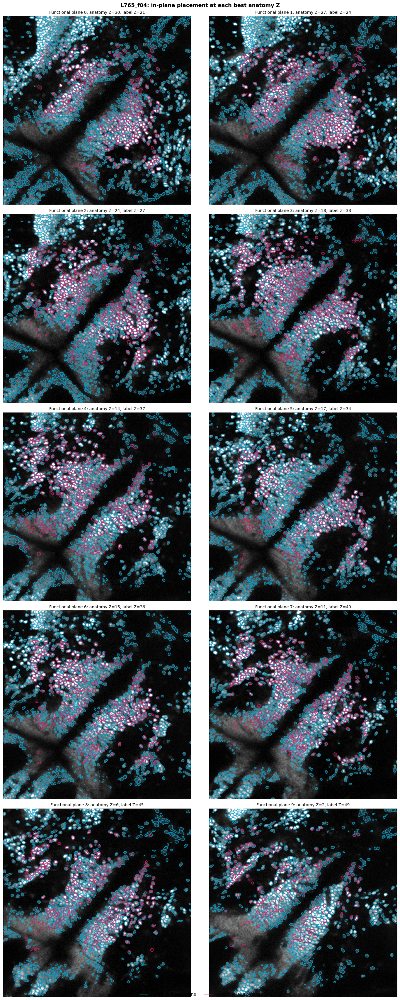

In [4]:
# 06 — Display anatomy, anatomy-label, and functional-ROI overlays
PLACEMENT_OVERVIEW = render_geometry_placement_overview(geometry)
display(PLACEMENT_OVERVIEW)

## 07 — Review centroid offsets in anatomy context

Choose a plane for detailed review. The anatomy image and both label outlines show where each centroid link sits. The violin plot compares every plane's XY offsets with the median anatomy-label radius.

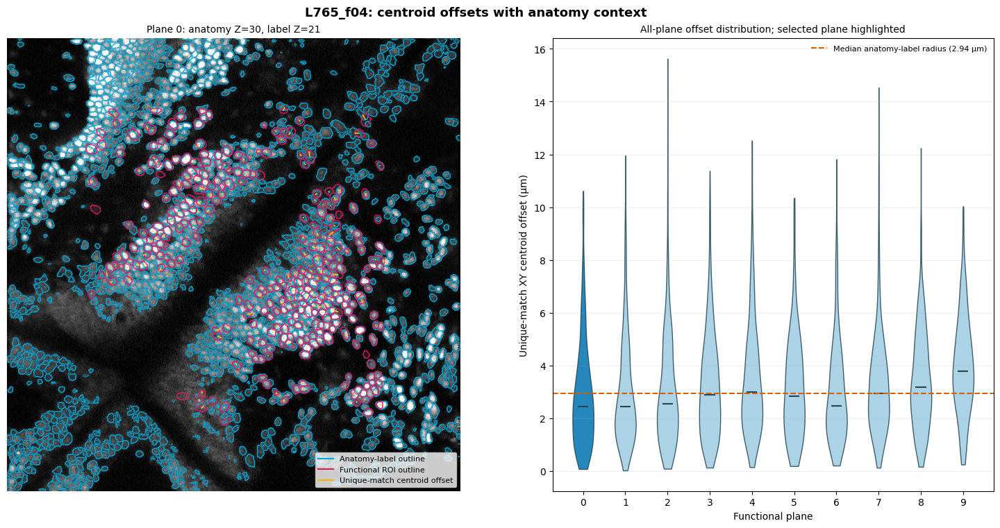

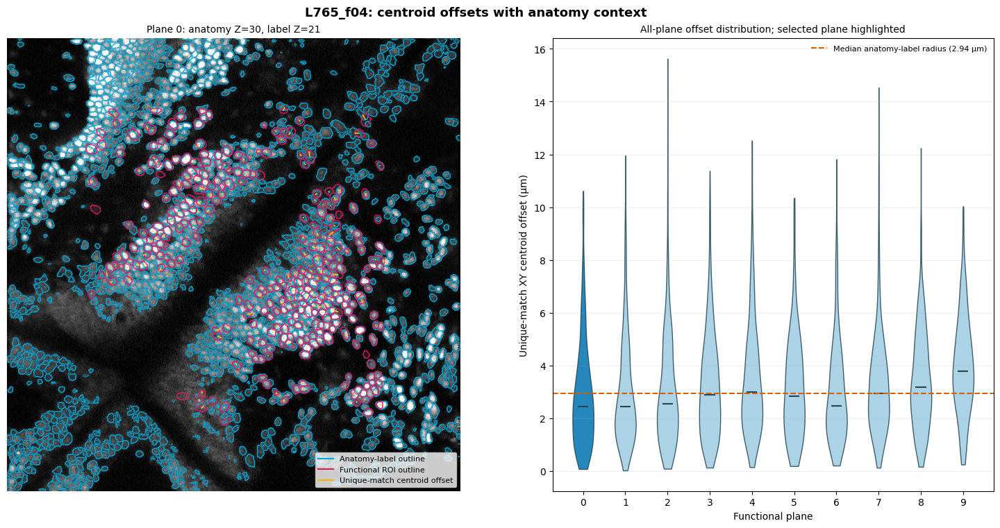

In [5]:
# 08 — Display centroid offsets with anatomy context
PLANE_INDEX = 0
CENTROID_OFFSET_FIGURE = render_centroid_offset_detail(geometry, plane_idx=PLANE_INDEX)
display(CENTROID_OFFSET_FIGURE)

## 09 — Q0.1 physical-unit audit

Use the physical XY spacing declared by the prepared anatomy NRRD. This recomputes the legacy `[53a]` centroid metric from the same frozen unique-match rows; it does not rematch ROIs. Do not redesign geometry panels until this audit is reviewed.

In [ ]:
if geometry.anatomy_stack_path is None: raise RuntimeError("Configure the prepared anatomy stack before running the unit audit.")
_vox = load_or_cache_voxels(geometry.anatomy_stack_path)
ANATOMY_XY_SPACING_UM = (float(_vox["X"]), float(_vox["Y"]))  # prepared anatomy NRRD header
XY_OFFSET_AUDIT = audit_xy_offset_units(geometry.matches, dx_um=ANATOMY_XY_SPACING_UM[0], dy_um=ANATOMY_XY_SPACING_UM[1])
XY_OFFSET_AUDIT_FIGURE = render_xy_offset_unit_audit(XY_OFFSET_AUDIT, fish_id=FISH_ID)
display(XY_OFFSET_AUDIT_FIGURE)
display(XY_OFFSET_AUDIT[["plane_idx", "func_label", "legacy_xy_offset_um", "reported_selected_dist_um", "reported_to_legacy_ratio"]].head())

## 09 — Record the review decision

Saving records what you reviewed. It does not change the geometry. Check unmatched ROIs and ROIs that lost a one-to-one assignment before accepting the result.

In [6]:
# 10 — Set the optional review note
SAVE_REVIEW = True
REVIEWER = 'Danin'
DECISION = 'accepted'  # accepted, rejected, or review_required
NOTES = ''

if SAVE_REVIEW:
    review_path = write_qc_review_record(
        qc_context,
        stage_name='match-roi-to-anatomy',
        decision=DECISION,
        reviewer=REVIEWER,
        reviewed_artifacts=[geometry.matches_path, geometry.summary_path, geometry.plane_meta_path],
        notes=NOTES,
    )
    print(review_path)

/Volumes/dataDrive/dataProcessing/2p_processing/_staged_pipeline_runs/20260803T112035Z_functional_registration_ants_no_fallback/L765_f04/match-roi-to-anatomy/reviews/review_20260901T113945.553200Z.json
